# 04. Evaluation & Results
 
This notebook evaluates the trained GAT-GAE/HAN-GAE models for functional clustering in Liverpool.

In [1]:
"""
# Colab setup (optional)
!git clone https://github.com/c2g-dev/city2graph-case-study.git

import os
REPO_DIR = "/content/city2graph-case-study"
os.chdir(REPO_DIR)

# delete data directory
!rm -rf /content/city2graph-case-study/data

# download data zip from Zenodo and unzip into data/
!wget -O /content/city2graph-case-study/data.zip https://zenodo.org/records/18396286/files/data.zip?download=1
!unzip -o /content/city2graph-case-study/data.zip -d /content/city2graph-case-study/

!pip install torch_geometric
!pip install city2graph

os.chdir(REPO_DIR + "/notebooks")
"""

'\n# Colab setup (optional)\n!git clone https://github.com/c2g-dev/city2graph-case-study.git\n\nimport os\nREPO_DIR = "/content/city2graph-case-study"\nos.chdir(REPO_DIR)\n\n# delete data directory\n!rm -rf /content/city2graph-case-study/data\n\n# download data zip from Zenodo and unzip into data/\n!wget -O /content/city2graph-case-study/data.zip https://zenodo.org/records/18396286/files/data.zip?download=1\n!unzip -o /content/city2graph-case-study/data.zip -d /content/city2graph-case-study/\n\n!pip install torch_geometric\n!pip install city2graph\n\nos.chdir(REPO_DIR + "/notebooks")\n'

## 1. Setup & Configuration

In [2]:
import sys
import os
sys.path.append(os.path.abspath('..'))

import yaml
import torch
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe
import seaborn as sns
import contextily
import pyproj

from matplotlib.colors import to_hex
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from shapely.geometry import Point
from shapely import wkt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx
from sklearn.manifold import TSNE
from sklearn.preprocessing import normalize

import city2graph as c2g

# Load config
with open('../configs/experiment_config.yaml', 'r') as f:
    config = yaml.safe_load(f)

# Set seeds
np.random.seed(config['seeds']['global'])
torch.manual_seed(config['seeds']['global'])

# Pandas display options
pd.options.display.float_format = '{:,.2f}'.format

# Paths
DATA_ROOT = config['data']['root']
EMBEDDINGS_DIR = '../data/outputs/embeddings'
FIGURES_DIR = '../data/outputs/figures'
TABLES_DIR = '../data/outputs/tables'
CLUSTERS_DIR = '../data/outputs/clusters'

for d in [FIGURES_DIR, TABLES_DIR, CLUSTERS_DIR]:
    os.makedirs(d, exist_ok=True)

# Model configurations
MODELS = {
    'Baseline (PCA)': {'file': f"../{DATA_ROOT}/{config['data']['homo']}", 'type': 'baseline'},
    'Model 1 (GAT-GAE)': {'file': f"{EMBEDDINGS_DIR}/model1_gat_gae.pt", 'type': 'homo'},
    'Model 2 (HAN-GAE: Walk)': {'file': f"{EMBEDDINGS_DIR}/model2_han_gae_walk.pt", 'type': 'hetero'},
    'Model 3 (HAN-GAE: Multi)': {'file': f"{EMBEDDINGS_DIR}/model3_han_gae_multi.pt", 'type': 'hetero'},
    'Model 4 (HAN-GAE: All)': {'file': f"{EMBEDDINGS_DIR}/model4_han_gae_all.pt", 'type': 'hetero'},
    'Model 1S (GAT-GAE: Struct)': {'file': f"{EMBEDDINGS_DIR}/model1s_gat_gae_struct.pt", 'type': 'homo_struct'},
    'Model 2S (HAN-GAE: Walk-S)': {'file': f"{EMBEDDINGS_DIR}/model2s_han_gae_walk_struct.pt", 'type': 'hetero_struct'},
    'Model 3S (HAN-GAE: Multi-S)': {'file': f"{EMBEDDINGS_DIR}/model3s_han_gae_multi_struct.pt", 'type': 'hetero_struct'},
    'Model 4S (HAN-GAE: All-S)': {'file': f"{EMBEDDINGS_DIR}/model4s_han_gae_all_struct.pt", 'type': 'hetero_struct'}
}

# Embedding dimensions and beta dimensions per model
EMBEDDING_COLS = [f'embedding_{i}' for i in range(config['model']['out_dim'])]

# Update to capture both Layer 1 and Layer 2 betas
BETA_COLS = {
    'Model 2 (HAN-GAE: Walk)': [f'beta1_{i}' for i in range(2)] + [f'beta2_{i}' for i in range(2)],
    'Model 3 (HAN-GAE: Multi)': [f'beta1_{i}' for i in range(2)] + [f'beta2_{i}' for i in range(2)],
    'Model 4 (HAN-GAE: All)': [f'beta1_{i}' for i in range(3)] + [f'beta2_{i}' for i in range(3)]
}

RELATION_NAMES = {
    'Model 2 (HAN-GAE: Walk)': ['contig', '15_min_walk'],
    'Model 3 (HAN-GAE: Multi)': ['contig', '15_min_multi'],
    'Model 4 (HAN-GAE: All)': ['contig', '15_min_walk', '15_min_multi']
}

K_RANGE = range(2, 51)
CITY_CENTRE = {'lat': 53.403553, 'lon': -2.986844}  # Liverpool One

## 2. Load Embeddings & Convert to GeoDataFrames

In [3]:
# Load OA polygons for geometry mapping
oa_polygons = gpd.read_file('../data/processed/features/oa_with_features.gpkg').set_index('OA21CD')

# Dictionary to store GeoDataFrames with embeddings
model_gdfs = {}
attention_data = {}

# Load each saved embedding file and convert it into an OA-level GeoDataFrame
for model_name, meta in MODELS.items():
    print(f"\nLoading: {model_name}")
    data = torch.load(meta['file'], map_location='cpu', weights_only=False)

    is_hetero = meta['type'].startswith('hetero')
    beta_cols = BETA_COLS.get(model_name, [])

    # Handle baseline, homogeneous, and heterogeneous model outputs separately
    if meta['type'] == 'baseline':
        nodes_gdf, _ = c2g.pyg_to_gdf(data, node_types='oa')
    elif is_hetero:
        add_cols = {'oa': EMBEDDING_COLS + beta_cols}
        nodes_gdf = c2g.pyg_to_gdf(data, node_types=['oa'], additional_node_cols=add_cols)[0]['oa']
    else:
        nodes_gdf, _ = c2g.pyg_to_gdf(data, additional_node_cols=EMBEDDING_COLS)

    # Extract attention weights for HAN models
    if beta_cols:
        rels = RELATION_NAMES[model_name]
        attention_data[model_name] = {
            f'Layer {li}': nodes_gdf[[f'beta{li}_{i}' for i in range(len(rels))]].set_axis(rels, axis=1)
            for li in [1, 2]
        }

    # Replace geometry with OA polygons for choropleth mapping
    model_gdfs[model_name] = nodes_gdf.set_geometry(
        oa_polygons.loc[nodes_gdf.index, 'geometry']
    )

    print(f"  Loaded {len(model_gdfs[model_name])} OAs")

print("\nLoading base heterogeneous graph for modularity calculation...")
data_multi = torch.load(f"../{DATA_ROOT}/{config['data']['hetero_multi']}", map_location='cpu', weights_only=False)

# Rebuild relation-specific OA graphs used later for modularity scoring
oa_edge_types = [
    ('oa', 'contig', 'oa'),
    ('oa', '15_min_walk', 'oa'),
    ('oa', '15_min_multi', 'oa'),
]

oa_nodes_multi, oa_edges_multi = c2g.pyg_to_gdf(
    data_multi,
    node_types=['oa'],
    edge_types=oa_edge_types,
)

oa_nodes_gdf = oa_nodes_multi['oa']
oa_nodes = list(oa_nodes_gdf.index)

relation_edges = {
    rel: oa_edges_multi[('oa', rel, 'oa')]
    for rel in ['contig', '15_min_walk', '15_min_multi']
}

# Store relations separately for calculating modularity
nx_graphs = {}
for rel, edges_gdf in relation_edges.items():
    G = c2g.gdf_to_nx(nodes=oa_nodes_gdf, edges=edges_gdf)
    G = nx.relabel_nodes(
        G,
        {node_id: attrs['_original_index'] for node_id, attrs in G.nodes(data=True)},
    )
    nx_graphs[rel] = G
    print(f"  Extracted {rel} graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")


Loading: Baseline (PCA)
  Loaded 1624 OAs

Loading: Model 1 (GAT-GAE)
  Loaded 1624 OAs

Loading: Model 2 (HAN-GAE: Walk)
  Loaded 1624 OAs

Loading: Model 3 (HAN-GAE: Multi)
  Loaded 1624 OAs

Loading: Model 4 (HAN-GAE: All)
  Loaded 1624 OAs

Loading: Model 1S (GAT-GAE: Struct)
  Loaded 1624 OAs

Loading: Model 2S (HAN-GAE: Walk-S)
  Loaded 1624 OAs

Loading: Model 3S (HAN-GAE: Multi-S)
  Loaded 1624 OAs

Loading: Model 4S (HAN-GAE: All-S)
  Loaded 1624 OAs

Loading base heterogeneous graph for modularity calculation...
  Extracted contig graph: 1624 nodes, 4782 edges
  Extracted 15_min_walk graph: 1624 nodes, 28265 edges
  Extracted 15_min_multi graph: 1624 nodes, 69403 edges


## 3. Clustering Pipeline

For each model:
1. L2-normalize embeddings
2. Search for optimal K using Silhouette score
3. Run K-Means with multiple seeds for stability
4. Save best clustering results

In [4]:
def get_embeddings(gdf, model_type):
    """Extract embedding matrix from GeoDataFrame."""
    # Reduce baseline feature columns so every model uses the same embedding width
    if model_type == 'baseline':
        feat_cols = [c for c in gdf.columns if c not in ['geometry', 'cluster', 'cluster_label_rank'] and gdf[c].dtype in ['float64', 'float32', 'int64']]
        Z = gdf[feat_cols].values
        pca = PCA(n_components=len(EMBEDDING_COLS), random_state=config['seeds']['global'])
        Z = pca.fit_transform(Z)
    else:
        Z = gdf[EMBEDDING_COLS].values
    return normalize(Z, norm='l2')

def optimal_k_clustering(Z, nx_graphs, node_ids, k_range, n_seeds=10, base_seed=42):
    """Find optimal K via silhouette search and run stable multi-seed clustering."""

    # Keep each embedding row tied to its OA identifier. The relation graphs
    # may use a different internal node order, which must not determine the
    # community assignment used for modularity.
    node_ids = list(node_ids)
    if len(node_ids) != len(Z):
        raise ValueError(f"Expected one node ID per embedding row; got {len(node_ids)} IDs and {len(Z)} rows")
    unmatched_by_relation = {
        rel: set(node_ids).symmetric_difference(G.nodes)
        for rel, G in nx_graphs.items()
    }
    unmatched_by_relation = {rel: nodes for rel, nodes in unmatched_by_relation.items() if nodes}
    if unmatched_by_relation:
        details = ', '.join(f"{rel}: {len(nodes)}" for rel, nodes in unmatched_by_relation.items())
        raise ValueError(f"Embedding and relation-graph OA sets differ ({details})")

    # Score every candidate k before choosing the best silhouette result
    k_scores = []
    for k in k_range:
        km = KMeans(n_clusters=k, random_state=base_seed, n_init=10)
        labels = km.fit_predict(Z)
        mods = {'contig': np.nan, '15_min_walk': np.nan, '15_min_multi': np.nan}
        communities = [set() for _ in range(k)]
        for node_id, cluster_id in zip(node_ids, labels):
            communities[cluster_id].add(node_id)
        for rel, G in nx_graphs.items():
            mods[rel] = nx.community.modularity(G, communities)

        k_scores.append({
            'k': k,
            'silhouette': silhouette_score(Z, labels),
            'calinski_harabasz': calinski_harabasz_score(Z, labels),
            'davies_bouldin': davies_bouldin_score(Z, labels),
            'modularity_contig': mods.get('contig', np.nan),
            'modularity_walk': mods.get('15_min_walk', np.nan),
            'modularity_multi': mods.get('15_min_multi', np.nan)
        })

    k_df = pd.DataFrame(k_scores)
    best_k = int(k_df.loc[k_df['silhouette'].idxmax(), 'k'])

    # Refit the chosen k several times and keep the strongest repeat run
    # Multi-seed stability
    results = []
    for i in range(n_seeds):
        km = KMeans(n_clusters=best_k, random_state=base_seed + i, n_init=10)
        labels = km.fit_predict(Z)
        mods = {'contig': np.nan, '15_min_walk': np.nan, '15_min_multi': np.nan}
        communities = [set() for _ in range(best_k)]
        for node_id, cluster_id in zip(node_ids, labels):
            communities[cluster_id].add(node_id)
        for rel, G in nx_graphs.items():
            mods[rel] = nx.community.modularity(G, communities)

        results.append({
            'labels': labels,
            'silhouette': silhouette_score(Z, labels),
            'calinski_harabasz': calinski_harabasz_score(Z, labels),
            'davies_bouldin': davies_bouldin_score(Z, labels),
            'modularity_contig': mods.get('contig', np.nan),
            'modularity_walk': mods.get('15_min_walk', np.nan),
            'modularity_multi': mods.get('15_min_multi', np.nan)
        })

    best = max(results, key=lambda x: x['silhouette'])
    return {
        'k': best_k,
        'labels': best['labels'],
        'silhouette': best['silhouette'],
        'silhouette_std': np.std([r['silhouette'] for r in results]),
        'calinski_harabasz': best['calinski_harabasz'],
        'calinski_harabasz_std': np.std([r['calinski_harabasz'] for r in results]),
        'davies_bouldin': best['davies_bouldin'],
        'davies_bouldin_std': np.std([r['davies_bouldin'] for r in results]),
        'modularity_contig': best['modularity_contig'],
        'modularity_contig_std': np.std([r['modularity_contig'] for r in results]),
        'modularity_walk': best['modularity_walk'],
        'modularity_walk_std': np.std([r['modularity_walk'] for r in results]),
        'modularity_multi': best['modularity_multi'],
        'modularity_multi_std': np.std([r['modularity_multi'] for r in results]),
        'k_search': k_df
    }

# Run the clustering workflow once per model and save the selected labels
clustering_results = {}

for model_name, gdf in model_gdfs.items():
    print(f"\nClustering: {model_name}")
    Z = get_embeddings(gdf, MODELS[model_name]['type'])
    result = optimal_k_clustering(
        Z, nx_graphs, gdf.index, K_RANGE,
        n_seeds=10, base_seed=config['seeds']['clustering'],
    )

    # Add cluster labels to GeoDataFrame
    gdf['cluster'] = result['labels']
    clustering_results[model_name] = result

    # Save cluster assignments
    safe_name = model_name.lower().replace(' ', '_').replace('(', '').replace(')', '')
    gdf[['cluster']].to_csv(f"{CLUSTERS_DIR}/{safe_name}_kmeans.csv")

    print(f"  K={result['k']}, Silhouette={result['silhouette']:.2f}, DB={result['davies_bouldin']:.2f}, CH={result['calinski_harabasz']:.2f}")



Clustering: Baseline (PCA)
  K=2, Silhouette=0.23, DB=1.80, CH=482.08

Clustering: Model 1 (GAT-GAE)
  K=5, Silhouette=0.21, DB=1.62, CH=283.56

Clustering: Model 2 (HAN-GAE: Walk)
  K=44, Silhouette=0.42, DB=0.83, CH=467.16

Clustering: Model 3 (HAN-GAE: Multi)
  K=22, Silhouette=0.42, DB=0.79, CH=783.71

Clustering: Model 4 (HAN-GAE: All)
  K=26, Silhouette=0.41, DB=0.81, CH=636.18

Clustering: Model 1S (GAT-GAE: Struct)
  K=2, Silhouette=0.24, DB=1.42, CH=444.98

Clustering: Model 2S (HAN-GAE: Walk-S)
  K=2, Silhouette=0.37, DB=11.64, CH=1364.89

Clustering: Model 3S (HAN-GAE: Multi-S)
  K=2, Silhouette=0.30, DB=3.03, CH=1003.73

Clustering: Model 4S (HAN-GAE: All-S)
  K=2, Silhouette=0.21, DB=2.11, CH=529.87


## 3.5 Cluster Statistics (Table 2)
Display the range (min-max) of each index by clusters.

In [5]:
data = {}
for model_name, result in clustering_results.items():
    k_df = result['k_search']
    sil = k_df['silhouette']
    ch = k_df['calinski_harabasz']
    db = k_df['davies_bouldin']
    mc = k_df['modularity_contig'].dropna()
    mw = k_df['modularity_walk'].dropna()
    mm = k_df['modularity_multi'].dropna()
    
    data[model_name] = {
        ('Silhouette Score', 'Mean ± SD'): f"{sil.mean():.2f} ± {sil.std():.2f}",
        ('Modularity (Contig)', 'Mean ± SD'): f"{mc.mean():.2f} ± {mc.std():.2f}" if not mc.empty else "N/A",
        ('Modularity (Walk)', 'Mean ± SD'): f"{mw.mean():.2f} ± {mw.std():.2f}" if not mw.empty else "N/A",
        ('Modularity (Multi)', 'Mean ± SD'): f"{mm.mean():.2f} ± {mm.std():.2f}" if not mm.empty else "N/A",
    }

# Create DataFrame from dict (keys=Models -> Rows)
df_results_range = pd.DataFrame(data).T
# Set column names for MultiIndex
df_results_range.columns.names = ['Metric', 'Statistic']

display(df_results_range)
df_results_range.to_csv(f"{TABLES_DIR}/cluster_stats_mean_std.csv")


Metric,Silhouette Score,Modularity (Contig),Modularity (Walk),Modularity (Multi)
Statistic,Mean ± SD,Mean ± SD,Mean ± SD,Mean ± SD
Baseline (PCA),0.19 ± 0.01,0.09 ± 0.02,0.04 ± 0.01,0.01 ± 0.01
Model 1 (GAT-GAE),0.19 ± 0.01,0.60 ± 0.03,0.33 ± 0.05,0.08 ± 0.05
Model 2 (HAN-GAE: Walk),0.37 ± 0.06,0.77 ± 0.06,0.67 ± 0.07,0.20 ± 0.10
Model 3 (HAN-GAE: Multi),0.39 ± 0.04,0.75 ± 0.06,0.62 ± 0.09,0.30 ± 0.13
Model 4 (HAN-GAE: All),0.38 ± 0.04,0.79 ± 0.06,0.68 ± 0.07,0.28 ± 0.14
Model 1S (GAT-GAE: Struct),0.10 ± 0.04,0.04 ± 0.01,0.01 ± 0.00,-0.00 ± 0.00
Model 2S (HAN-GAE: Walk-S),0.15 ± 0.04,0.01 ± 0.00,0.01 ± 0.00,0.00 ± 0.00
Model 3S (HAN-GAE: Multi-S),0.17 ± 0.03,0.02 ± 0.01,0.01 ± 0.00,0.00 ± 0.00
Model 4S (HAN-GAE: All-S),0.09 ± 0.02,0.01 ± 0.00,0.00 ± 0.00,0.00 ± 0.00


In [6]:
data = {}
for model_name, result in clustering_results.items():
    k_df = result['k_search']
    sil = k_df['silhouette']
    db = k_df['davies_bouldin']
    ch = k_df['calinski_harabasz']
    mc = k_df['modularity_contig'].dropna()
    mw = k_df['modularity_walk'].dropna()
    mm = k_df['modularity_multi'].dropna()
    
    data[model_name] = {
        ('Calinski-Harabasz', 'Mean ± SD'): f"{ch.mean():.2f} ± {ch.std():.2f}",
        ('Davies-Bouldin', 'Mean ± SD'): f"{db.mean():.2f} ± {db.std():.2f}" if not db.empty else "N/A",
    }

# Create DataFrame from dict (keys=Models -> Rows)
df_results_range = pd.DataFrame(data).T
# Set column names for MultiIndex
df_results_range.columns.names = ['Metric', 'Statistic']

display(df_results_range)
df_results_range.to_csv(f"{TABLES_DIR}/cluster_stats_mean_std_appendix.csv")


Metric,Calinski-Harabasz,Davies-Bouldin
Statistic,Mean ± SD,Mean ± SD
Baseline (PCA),139.06 ± 78.94,1.76 ± 0.08
Model 1 (GAT-GAE),177.61 ± 64.97,1.54 ± 0.10
Model 2 (HAN-GAE: Walk),434.85 ± 35.09,1.01 ± 0.25
Model 3 (HAN-GAE: Multi),737.96 ± 76.63,0.90 ± 0.17
Model 4 (HAN-GAE: All),611.88 ± 54.47,0.93 ± 0.19
Model 1S (GAT-GAE: Struct),130.35 ± 84.44,14.55 ± 6.19
Model 2S (HAN-GAE: Walk-S),298.83 ± 230.01,10.81 ± 3.87
Model 3S (HAN-GAE: Multi-S),332.12 ± 186.49,7.46 ± 3.18
Model 4S (HAN-GAE: All-S),123.63 ± 87.97,9.52 ± 4.46


## 3.6 Cluster Chart

In [7]:
def plot_cluster_metric(metric_col, ylabel, save_filename, show_optimal_k=False):
    """Plot a clustering metric across k for all models in a single panel."""
    MODEL_COLORS = {
        "Baseline (PCA)":              "#000000",  # black
        "Model 1 (GAT-GAE)":           "#009E73",  # bluish green
        "Model 2 (HAN-GAE: Walk)":     "#E69F00",  # orange
        "Model 3 (HAN-GAE: Multi)":    "#56B4E9",  # sky blue
        "Model 4 (HAN-GAE: All)":      "#0072B2",  # blue
        "Model 1S (GAT-GAE: Struct)":  "#009E73",
        "Model 2S (HAN-GAE: Walk-S)":  "#E69F00",
        "Model 3S (HAN-GAE: Multi-S)": "#56B4E9",
        "Model 4S (HAN-GAE: All-S)":   "#0072B2",
    }
    MODEL_MARKERS = {
        "Baseline (PCA)":                 "o",
        "Model 1 (GAT-GAE)":              "s",
        "Model 2 (HAN-GAE: Walk)":        "^",
        "Model 3 (HAN-GAE: Multi)":       "D",
        "Model 4 (HAN-GAE: All)":         "v",
        "Model 1S (GAT-GAE: Struct)":     "s",
        "Model 2S (HAN-GAE: Walk-S)":     "^",
        "Model 3S (HAN-GAE: Multi-S)":    "D",
        "Model 4S (HAN-GAE: All-S)":      "v",
    }
    MARKER_SIZES = {
        "Baseline (PCA)": 4,
        "Model 1 (GAT-GAE)": 5,
        "Model 2 (HAN-GAE: Walk)": 5.5,
        "Model 3 (HAN-GAE: Multi)": 4,
        "Model 4 (HAN-GAE: All)": 5.5,
        "Model 1S (GAT-GAE: Struct)": 5,
        "Model 2S (HAN-GAE: Walk-S)": 6,
        "Model 3S (HAN-GAE: Multi-S)": 4.5,
        "Model 4S (HAN-GAE: All-S)": 6,
    }

    def _mark_optimal_k(m, k_df, struct):
        """Plot a star at the model's selected optimal k on the current metric."""
        opt_k = clustering_results[m]['k']
        opt_val = k_df.loc[k_df['k'] == opt_k, metric_col]
        if opt_val.empty or pd.isna(opt_val.values[0]):
            return

        star_size = 10

        if struct:
            ax.plot(opt_k, opt_val.values[0], marker='*', markersize=star_size,
                    markerfacecolor='white', markeredgecolor=MODEL_COLORS[m],
                    markeredgewidth=1.4, linestyle='none', zorder=6)
        else:
            ax.plot(opt_k, opt_val.values[0], marker='*', markersize=star_size,
                    markerfacecolor=MODEL_COLORS[m], markeredgecolor=MODEL_COLORS[m],
                    markeredgewidth=0.8, linestyle='none', zorder=6)

    struct_models = [m for m in clustering_results if "S (" in m]
    other_models = [m for m in clustering_results if "S (" not in m]

    fig, ax = plt.subplots(figsize=(12, 6.5))

    for m in struct_models:
        k_df = clustering_results[m]['k_search']
        if metric_col not in k_df.columns or k_df[metric_col].isna().all():
            continue

        ax.plot(
            k_df['k'], k_df[metric_col],
            marker='o',#MODEL_MARKERS[m],
            markersize=4.5, #MARKER_SIZES[m],
            markerfacecolor='white',
            markeredgecolor=MODEL_COLORS[m],
            markeredgewidth=1.2,
            color=MODEL_COLORS[m],
            label=m,
            linewidth=0.8,
            linestyle="--",
            alpha=1.0
        )
        if show_optimal_k:
            _mark_optimal_k(m, k_df, struct=True)

    for m in other_models:
        k_df = clustering_results[m]['k_search']
        if metric_col not in k_df.columns or k_df[metric_col].isna().all():
            continue

        ax.plot(
            k_df['k'], k_df[metric_col],
            marker='o',#MODEL_MARKERS[m],
            markersize=4.5, #MARKER_SIZES[m],
            color=MODEL_COLORS[m],
            label=m,
            linewidth=1,
            linestyle="-",
            alpha=1.0
        )
        if show_optimal_k:
            _mark_optimal_k(m, k_df, struct=False)

    ax.set_xlabel('Number of Clusters (k)', fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.tick_params(axis='both', labelsize=14)
    ax.grid(True, linestyle='--', alpha=0.5)

    handles, labels = ax.get_legend_handles_labels()
    label_to_handle = dict(zip(labels, handles))

    proposed = ["Model 1 (GAT-GAE)", "Model 2 (HAN-GAE: Walk)", "Model 3 (HAN-GAE: Multi)", "Model 4 (HAN-GAE: All)"]
    struct = ["Model 1S (GAT-GAE: Struct)", "Model 2S (HAN-GAE: Walk-S)", "Model 3S (HAN-GAE: Multi-S)", "Model 4S (HAN-GAE: All-S)"]

    star_handle = Line2D([], [], marker='*', color='none', markerfacecolor='#cccccc',
                         markeredgecolor='black', markeredgewidth=0.8, markersize=11,
                         linestyle='none')

    ordered_handles = []
    ordered_labels = []
    col3 = [
        ("Baseline (PCA)", label_to_handle.get("Baseline (PCA)", Line2D([], [], linestyle="none"))),
        ("Optimal $k$" if show_optimal_k else "", star_handle if show_optimal_k else Line2D([], [], linestyle="none")),
        ("", Line2D([], [], linestyle="none")),
        ("", Line2D([], [], linestyle="none")),
    ]

    for i in range(4):
        ordered_handles.append(label_to_handle.get(proposed[i], Line2D([], [], linestyle="none")))
        ordered_labels.append(proposed[i])
    for i in range(4):
        ordered_handles.append(label_to_handle.get(struct[i], Line2D([], [], linestyle="none")))
        ordered_labels.append(struct[i])
    for i in range(4):
        ordered_handles.append(col3[i][1])
        ordered_labels.append(col3[i][0])

    legend = ax.legend(handles=ordered_handles, labels=ordered_labels,
              loc="lower center", bbox_to_anchor=(0.5, -0.41),
              ncol=3, fontsize=12, title_fontsize=14,
              frameon=True, facecolor="white", framealpha=1, edgecolor="lightgray",
              columnspacing=1.0, handletextpad=0.5)

    keep_texts = set(labels) | {'Baseline (PCA)'}
    if show_optimal_k:
        keep_texts.add('Optimal $k$')
    for text in legend.get_texts():
        if text.get_text() == '' or text.get_text() not in keep_texts:
            text.set_visible(False)

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.22)
    plt.savefig(f"{FIGURES_DIR}/{save_filename}", dpi=300, bbox_inches='tight')
    plt.show()


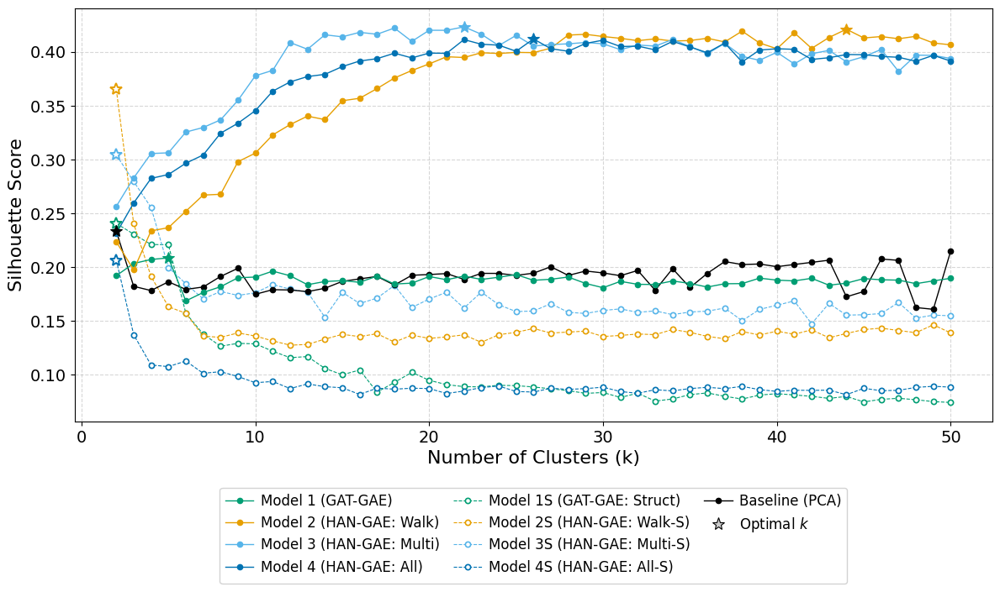

In [ ]:
# Plot Silhouette Score
plot_cluster_metric('silhouette', 'Silhouette Score', 'silhouette.jpg', show_optimal_k=True)

## 3.7 Cluster Chart (Davies-Bouldin)

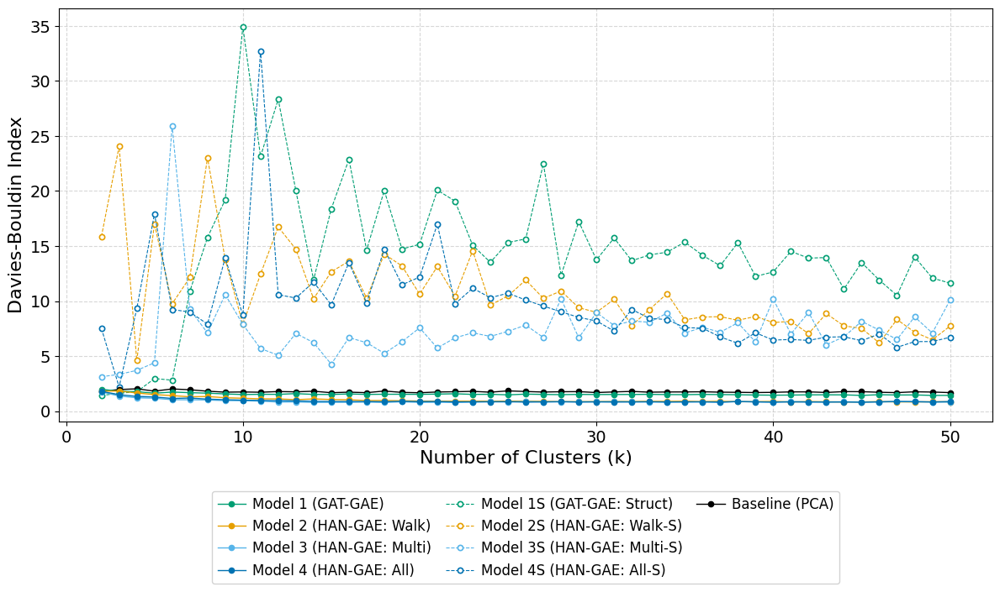

In [ ]:
# Plot Davies-Bouldin Index
plot_cluster_metric('davies_bouldin', 'Davies-Bouldin Index', 'davies_bouldin.jpg', show_optimal_k=False)

## 3.8 Cluster Chart (Calinski-Harabasz)

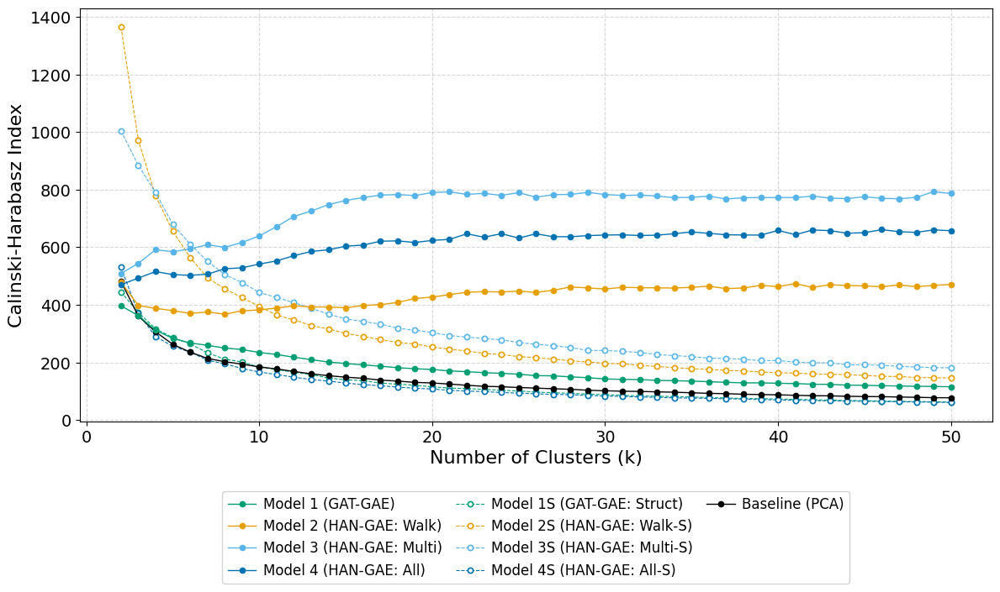

In [ ]:
# Plot Calinski-Harabasz Index
plot_cluster_metric('calinski_harabasz', 'Calinski-Harabasz Index', 'calinski_harabasz.jpg', show_optimal_k=False)

## 3.9 Cluster Chart (Modularity - Contiguity)

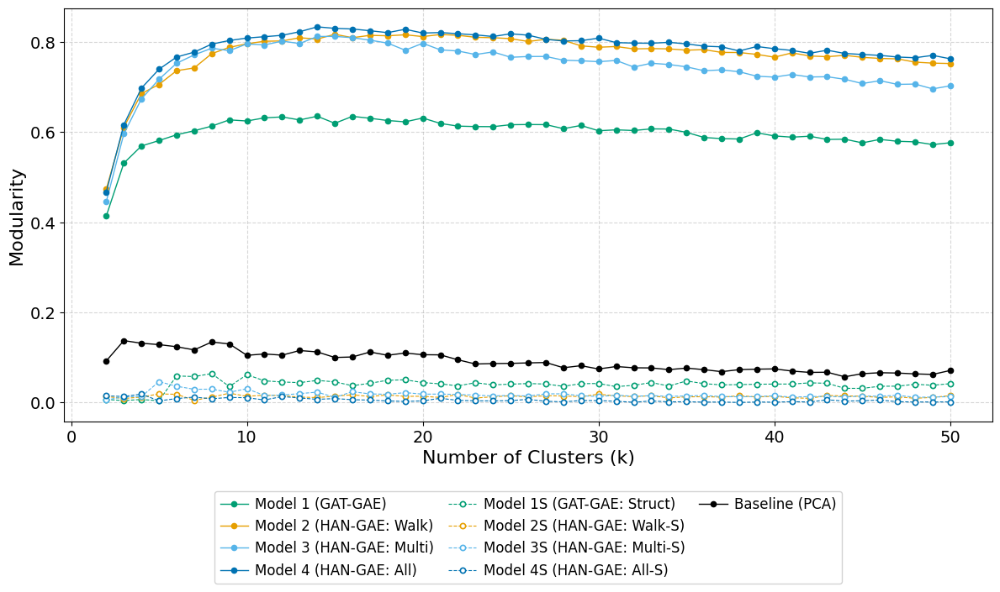

In [ ]:
# Plot Modularity - Contiguity
plot_cluster_metric('modularity_contig', 'Modularity', 'modularity_contig.jpg')

## 3.10 Cluster Chart (Modularity - 15 Min Walk)

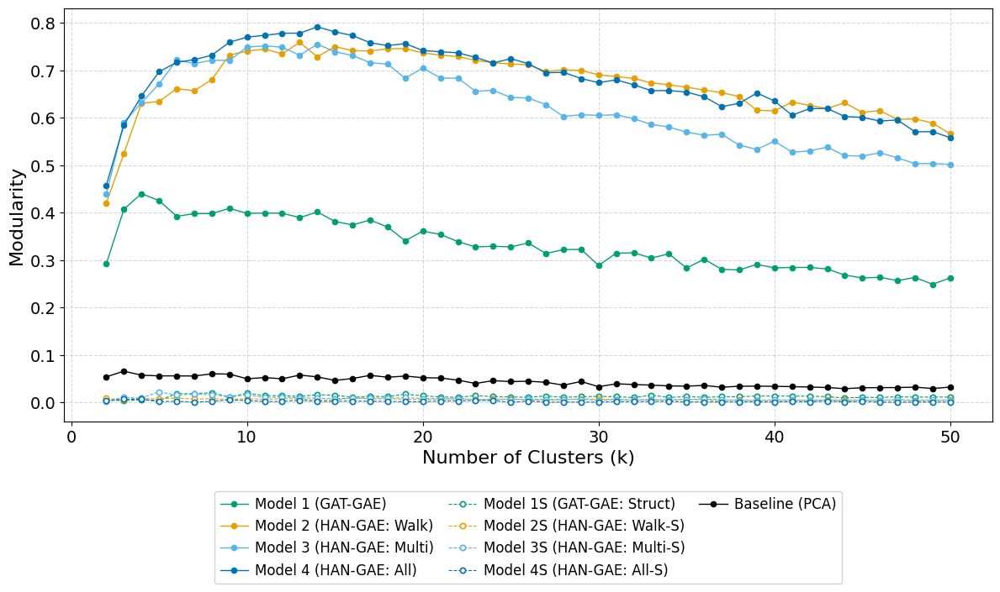

In [ ]:
# Plot Modularity - 15 Min Walk
plot_cluster_metric('modularity_walk', 'Modularity', 'modularity_walk.jpg')

## 3.11 Cluster Chart (Modularity - 15 Min Multi)

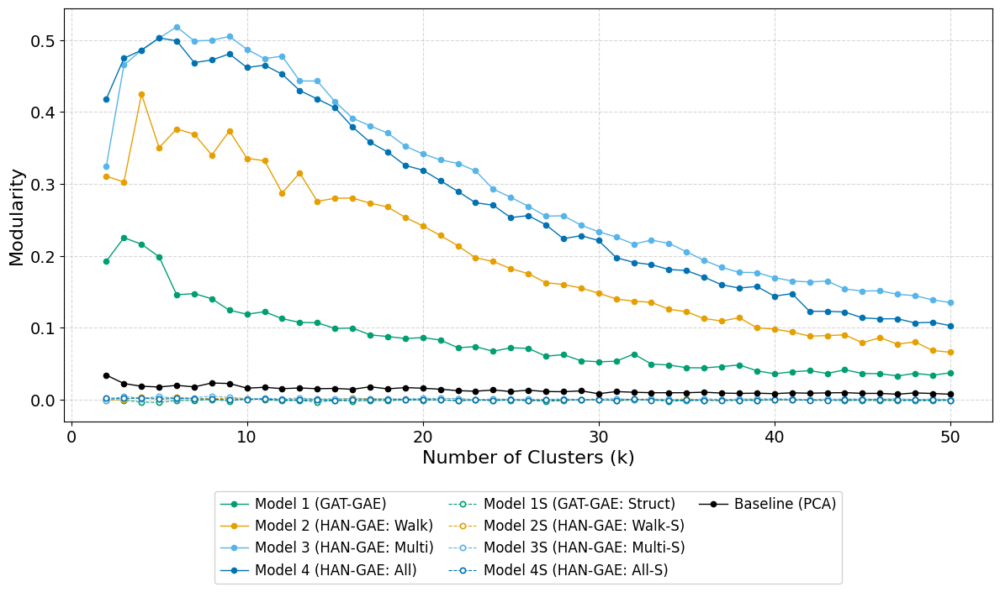

In [13]:
# Plot Modularity - 15 Min Multi
plot_cluster_metric('modularity_multi', 'Modularity', 'modularity_multi.jpg')

## 6. Cluster Map Visualizations using c2g.plot_graph

In [14]:
# Shared setup for map visualizations

# Transform city centre to projected CRS
transformer = pyproj.Transformer.from_crs('EPSG:4326', model_gdfs['Model 1 (GAT-GAE)'].crs, always_xy=True)
centre_x, centre_y = transformer.transform(CITY_CENTRE['lon'], CITY_CENTRE['lat'])

# Find the OA containing or nearest to the city centre
ref_gdf = model_gdfs['Model 1 (GAT-GAE)']
centre_oa_idx = ref_gdf.geometry.distance(Point(centre_x, centre_y)).idxmin()
print(f"City centre OA: {centre_oa_idx}")

# Global categorical palette (shuffled for visual distinctness)
base_palette = (sns.color_palette("bright", 10) + sns.color_palette("dark", 10) +
                sns.color_palette("husl", 15) + sns.color_palette("pastel", 15))
rng = np.random.RandomState(42)
GLOBAL_COLORS = [to_hex(c) for c in base_palette]
rng.shuffle(GLOBAL_COLORS)

# Split models: proposed vs baselines
proposed_models = [m for m in model_gdfs if 'S (' not in m and m != 'Baseline (PCA)']
baseline_models = [m for m in model_gdfs if 'S (' in m]

City centre OA: E00176629


In [15]:
all_models = ['Baseline (PCA)'] + proposed_models + baseline_models

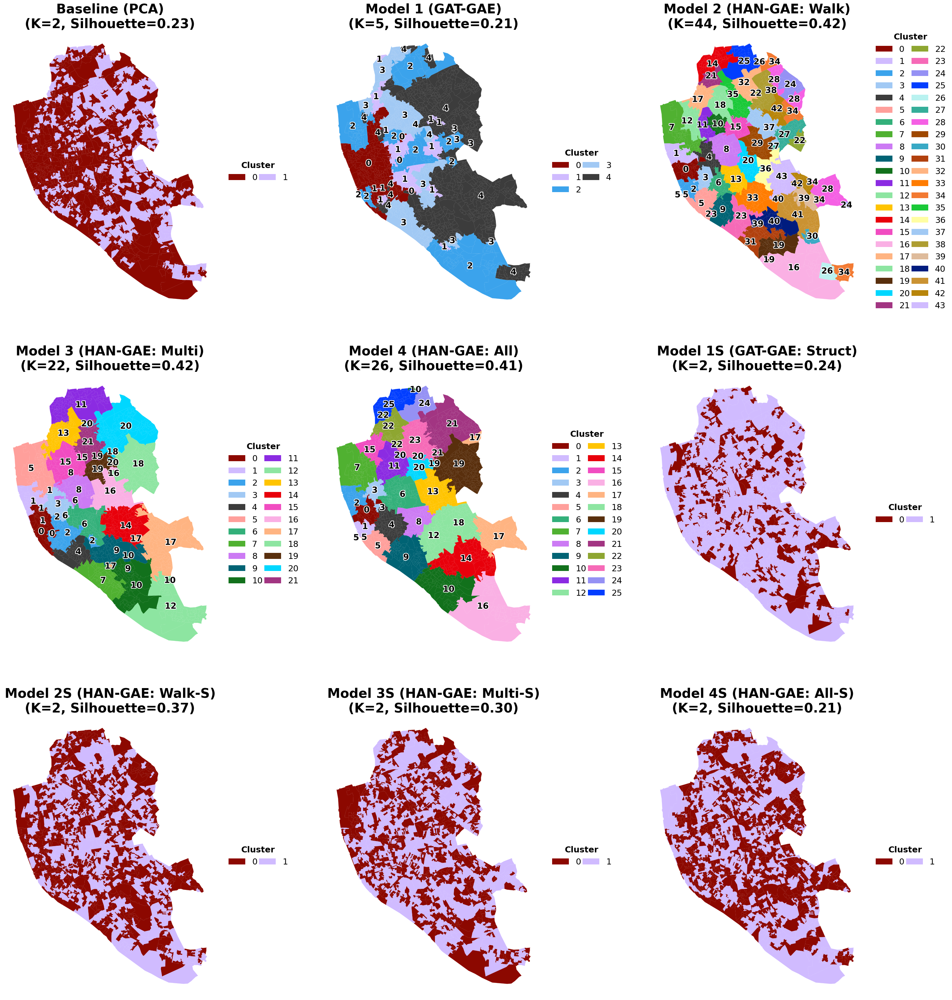

In [16]:
# Cluster Maps

def adjust_component_labels(ax, labels, padding=2.0, max_iter=500):
    """Separate overlapping component labels and connect displaced labels to their anchors."""
    if len(labels) < 2:
        return

    fig = ax.figure
    fig.canvas.draw()
    renderer = fig.canvas.get_renderer()
    anchors = np.array([ax.transData.transform(anchor) for _, anchor in labels], dtype=float)
    positions = anchors.copy()
    extents = [text.get_window_extent(renderer=renderer) for text, _ in labels]
    widths = np.array([extent.width for extent in extents])
    heights = np.array([extent.height for extent in extents])
    axes_bbox = ax.get_window_extent(renderer=renderer)

    # Resolve collisions in display coordinates so spacing is independent of map units.
    for _ in range(max_iter):
        moved = False
        for i in range(len(labels)):
            for j in range(i + 1, len(labels)):
                delta = positions[j] - positions[i]
                overlap_x = (widths[i] + widths[j]) / 2 + padding - abs(delta[0])
                overlap_y = (heights[i] + heights[j]) / 2 + padding - abs(delta[1])
                if overlap_x <= 0 or overlap_y <= 0:
                    continue

                moved = True
                if overlap_x < overlap_y:
                    direction = 1.0 if delta[0] > 0 or (delta[0] == 0 and j > i) else -1.0
                    shift = direction * overlap_x / 2
                    positions[i, 0] -= shift
                    positions[j, 0] += shift
                else:
                    direction = 1.0 if delta[1] > 0 or (delta[1] == 0 and j > i) else -1.0
                    shift = direction * overlap_y / 2
                    positions[i, 1] -= shift
                    positions[j, 1] += shift

        # Keep every label inside its subplot, including labels displaced from tiny components.
        positions[:, 0] = np.clip(positions[:, 0], axes_bbox.x0 + widths / 2, axes_bbox.x1 - widths / 2)
        positions[:, 1] = np.clip(positions[:, 1], axes_bbox.y0 + heights / 2, axes_bbox.y1 - heights / 2)
        if not moved:
            break

    inverse = ax.transData.inverted()
    for (text, anchor), display_position, original_position in zip(labels, positions, anchors):
        data_position = inverse.transform(display_position)
        text.set_position(data_position)
        if np.linalg.norm(display_position - original_position) > 4:
            ax.annotate(
                '', xy=anchor, xytext=data_position,
                arrowprops={'arrowstyle': '-', 'color': '0.25', 'linewidth': 0.6, 'alpha': 0.7},
                zorder=text.get_zorder() - 0.1,
            )

for model_list, n_rows, n_cols, save_name in [
    (all_models, 3, 3, 'cluster_maps.jpg'),
]:
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 10, n_rows * 10))
    axes = np.atleast_2d(axes)

    for idx, model_name in enumerate(model_list):
        ax = axes[idx // n_cols, idx % n_cols]
        gdf = model_gdfs[model_name]
        result = clustering_results[model_name]
        Z = get_embeddings(gdf, MODELS[model_name]['type'])

        # Compute cosine similarity between city-centre cluster centroid and all others
        # Use the city-centre cluster as the reference when ranking all cluster centroids
        centre_pos = list(gdf.index).index(centre_oa_idx)
        target_label = result['labels'][centre_pos]
        centroids = pd.DataFrame(Z).assign(label=result['labels']).groupby('label').mean()
        target_vec = centroids.loc[target_label].values.reshape(1, -1)
        cluster_sims = dict(zip(centroids.index, cosine_similarity(target_vec, centroids.values)[0]))

        # Rank clusters by similarity (highest first)
        sorted_labels = sorted(cluster_sims, key=cluster_sims.get, reverse=True)
        rank_color_map = {label: GLOBAL_COLORS[i % len(GLOBAL_COLORS)] for i, label in enumerate(sorted_labels)}
        label_to_rank = {label: i for i, label in enumerate(sorted_labels)}

        # Set node colors
        node_colors = [rank_color_map[l] for l in result['labels']]

        # Plot nodes
        c2g.plot_graph(
            nodes=gdf,
            ax=ax,
            node_color=node_colors,
            node_edgecolor=node_colors,#'white',
            node_alpha=1,
            linewidth=0.1,
            bgcolor='white'
            )

        # Add cluster rank numbers to every disconnected component for Models 1-4
        component_labels = []
        if model_name not in ["Baseline (PCA)", "Model 1S (GAT-GAE: Struct)", "Model 2S (HAN-GAE: Walk-S)", "Model 3S (HAN-GAE: Multi-S)", "Model 4S (HAN-GAE: All-S)"]:
            # Merge polygons by ranked cluster so one label is placed per contiguous area
            gdf_temp = gdf.assign(cluster_label_rank=[label_to_rank[l] for l in result['labels']])
            dissolved = gdf_temp.dissolve(by='cluster_label_rank').reset_index()
            for _, row in dissolved.iterrows():
                geom = row.geometry
                polys = list(geom.geoms) if geom.geom_type == 'MultiPolygon' else [geom] if geom.geom_type == 'Polygon' else []
                for poly in polys:
                    anchor = poly.representative_point()
                    text = ax.text(anchor.x, anchor.y, str(row['cluster_label_rank']), fontsize=18,
                                   ha='center', va='center', color='black', weight='bold', zorder=10,
                                   path_effects=[pe.withStroke(linewidth=3, foreground="white")])
                    component_labels.append((text, (anchor.x, anchor.y)))
            adjust_component_labels(ax, component_labels)


        # Add legend and title
        legend_elements = [
            Patch(facecolor=rank_color_map[ol], edgecolor=None,
                  label=f"{i}")
            for i, ol in enumerate(sorted_labels)
        ]
        leg = ax.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.02, 0.5),
                  title='Cluster', title_fontsize=18, frameon=False, prop={'size': 18}, ncol=2, columnspacing=0.2)
        leg.get_title().set_fontweight('bold')

        ax.set_title(f"{model_name}\n(K={result['k']}, Silhouette={result['silhouette']:.2f})",
                     fontsize=28, fontweight='bold')
        ax.set_axis_off()

    # Hide unused axes
    for i in range(len(model_list), n_rows * n_cols):
        axes[i // n_cols, i % n_cols].set_visible(False)

    plt.tight_layout()
    plt.savefig(os.path.join(FIGURES_DIR, save_name), dpi=300, bbox_inches='tight')#, pil_kwargs={'quality': 95})
    plt.show()

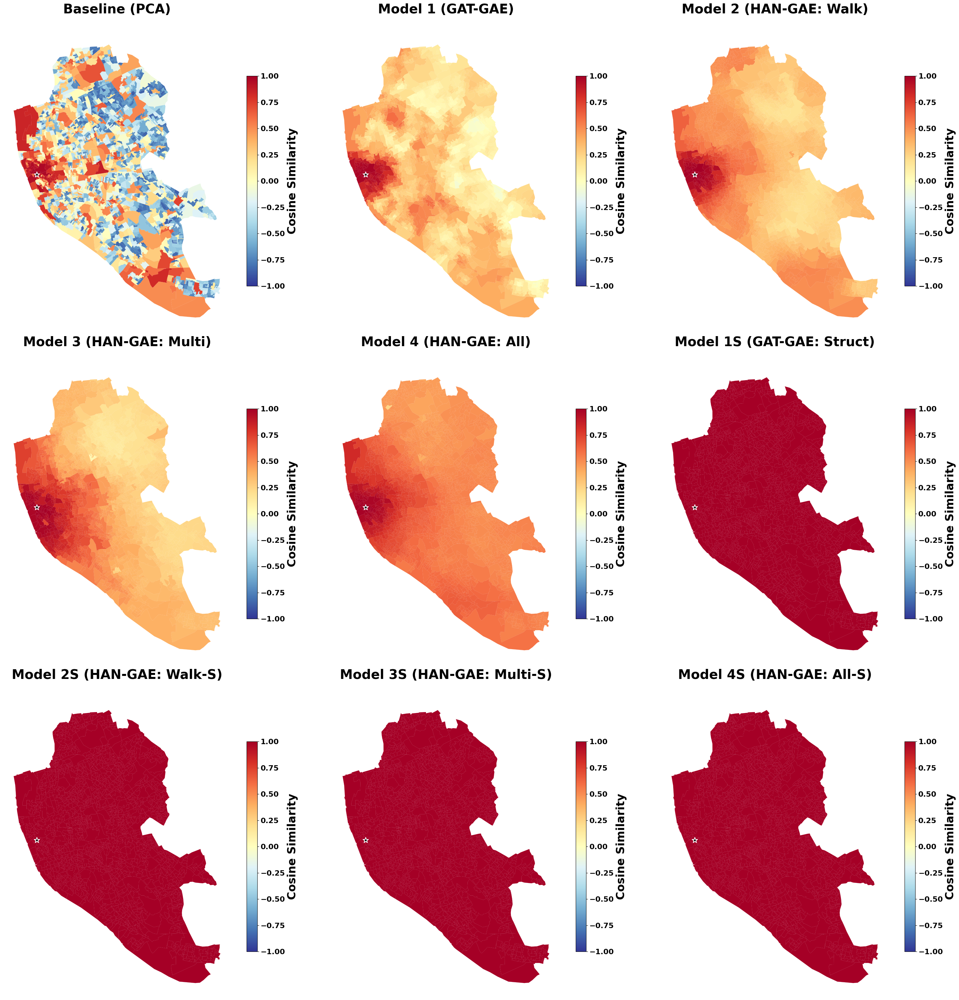

In [17]:
# Cosine Similarity Maps

cmap = plt.get_cmap('RdYlBu_r')
norm = mcolors.Normalize(vmin=-1, vmax=1, clip=True)

for model_list, n_rows, n_cols, save_name in [
    (all_models, 3, 3, 'similarity_maps.jpg'),
]:
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 10, n_rows * 10))
    axes = np.atleast_2d(axes)

    for idx, model_name in enumerate(model_list):
        ax = axes[idx // n_cols, idx % n_cols]
        gdf = model_gdfs[model_name]
        Z = get_embeddings(gdf, MODELS[model_name]['type'])

        # Cosine similarity of each OA embedding to the city centre OA
        # Compare each OA embedding directly with the city-centre OA embedding
        centre_pos = list(gdf.index).index(centre_oa_idx)
        sims = cosine_similarity(Z[centre_pos:centre_pos+1], Z)[0]

        # Set node colors
        node_colors = [to_hex(cmap(norm(v))) for v in sims]

        # Plot nodes
        c2g.plot_graph(
            nodes=gdf,
            ax=ax,
            node_color=node_colors,
            node_edgecolor=node_colors,#'white',
            node_alpha=1,
            linewidth=0.1,
            bgcolor='white'
            )

        # Add the location of Liverpool ONE
        ax.scatter([centre_x], [centre_y], c='black', s=150, marker='*', zorder=5,
                   edgecolors='white', linewidths=1.5)

        # Add subplot label and legend
        sm = plt.cm.ScalarMappable(cmap='RdYlBu_r', norm=plt.Normalize(vmin=-1, vmax=1))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=ax, shrink=0.7)
        cbar.set_label('Cosine Similarity', fontsize=24, weight='bold')
        ax.set_title(f"{model_name}\n", fontsize=28, fontweight='bold')
        ax.set_axis_off()

        for label in cbar.ax.get_yticklabels():
            label.set_fontsize(16)
            label.set_fontweight('bold')

    # Hide unused axes
    for i in range(len(model_list), n_rows * n_cols):
        axes[i // n_cols, i % n_cols].set_visible(False)

    plt.tight_layout()
    plt.savefig(os.path.join(FIGURES_DIR, save_name), dpi=300, bbox_inches='tight')#, pil_kwargs={'quality': 95})
    plt.show()

## 7. Attention Heatmap using c2g.plot_graph

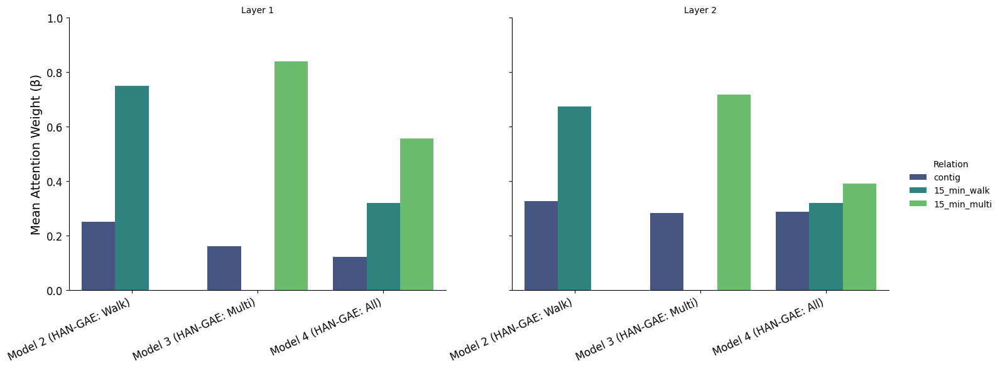

In [18]:
# Compute attention summary from attention_data
attention_summary = []
for model_name, layers_data in attention_data.items():
    for layer_name, beta_df in layers_data.items():
        # Summarize average attention weight by relation for each HAN layer
        for rel in beta_df.columns:
            attention_summary.append({
                'Model': model_name,
                'Layer': layer_name,
                'Relation': rel,
                'Mean \u03b2': beta_df[rel].mean(),
                'Std \u03b2': beta_df[rel].std()
            })

# Bar chart of mean semantic attention per relation
if len(attention_summary) > 0:
    df_att = pd.DataFrame(attention_summary)
    
    # Create a faceted plot: Rows=Layer, X=Model, Hue=Relation
    # Plot one panel per layer to compare relation importance across models
    g = sns.catplot(
        data=df_att, 
        kind="bar", 
        x="Model", 
        y="Mean \u03b2", 
        hue="Relation", 
        col="Layer",
        palette="viridis",
        height=6, 
        aspect=1.2,
        legend_out=True
    )
    
    g.set_axis_labels("", "Mean Attention Weight (\u03b2)", fontsize=14)
    g.set_titles("{col_name}", fontsize=16)
    g.set(ylim=(0, 1))
    
    # Rotate x-axis labels for better visibility
    for ax in g.axes.flat:
        ax.tick_params(axis='y', labelsize=12)
        for label in ax.get_xticklabels():
            label.set_fontsize(12)
            label.set_rotation(25)
            label.set_ha('right')
    
    g.tight_layout()
    plt.savefig(os.path.join(FIGURES_DIR, 'attention_bar.jpg'), dpi=150, bbox_inches='tight')#, pil_kwargs={'quality': 95})
    plt.show()

Saved Layer 1 plot to ../data/outputs/figures/attention_weight_layer_1.jpg


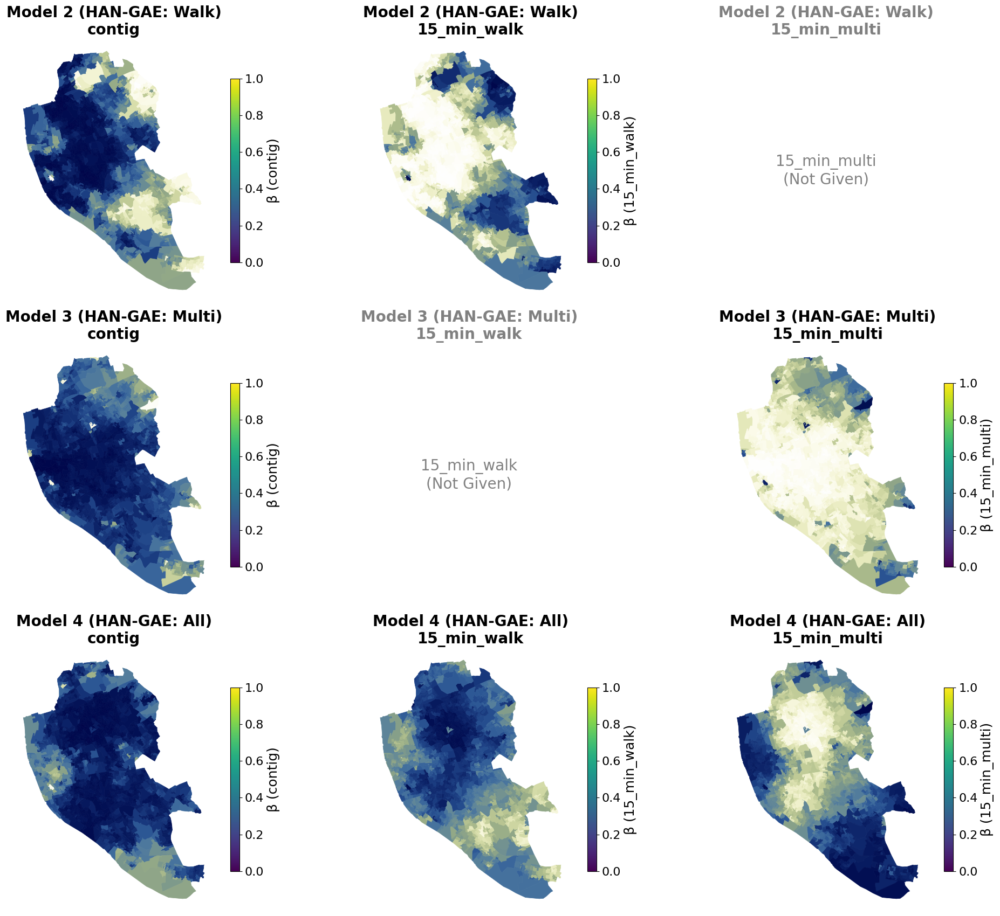

Saved Layer 2 plot to ../data/outputs/figures/attention_weight_layer_2.jpg


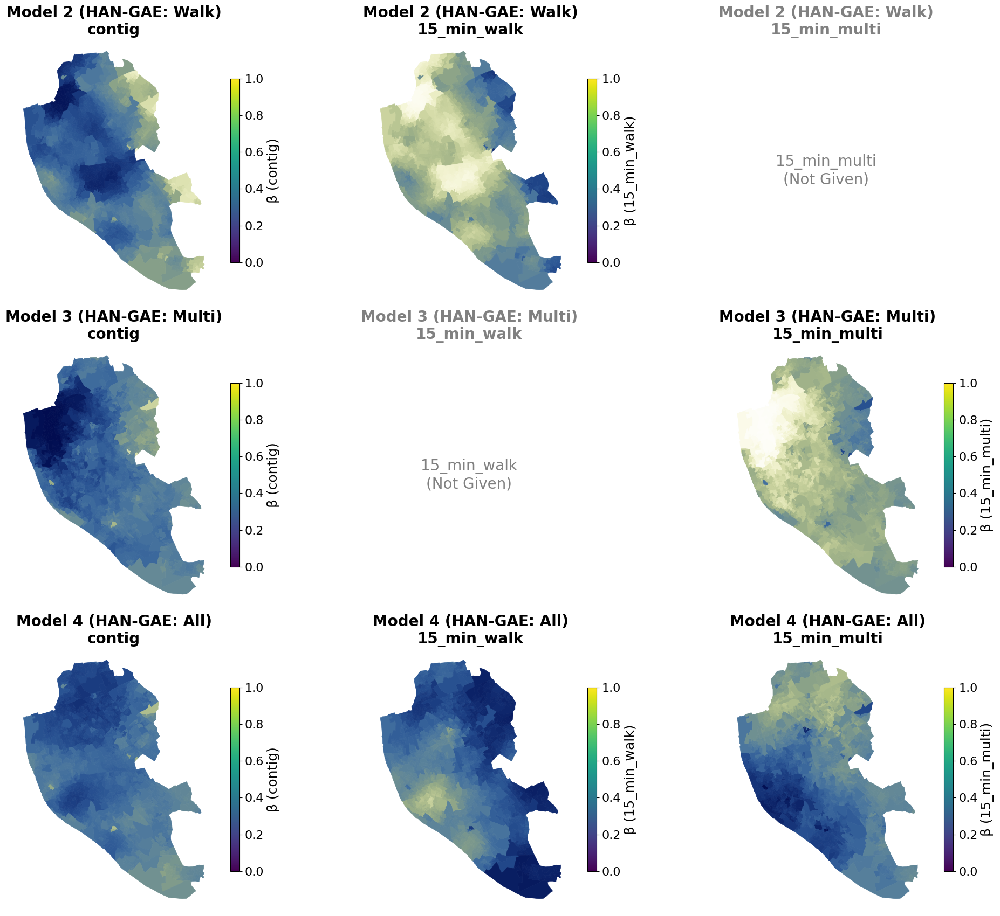

In [19]:
from cmcrameri import cm as cmc
from matplotlib.colors import LinearSegmentedColormap

base = cmc.davos.reversed()

def truncate(c, lo=0.2, hi=1, n=256):
    return LinearSegmentedColormap.from_list("trunc", c(np.linspace(lo, hi, n)))

cmap = cmc.davos #cm.viridis

# Panel of all beta (attention) heatmaps for all HAN models
han_models = ['Model 2 (HAN-GAE: Walk)', 'Model 3 (HAN-GAE: Multi)', 'Model 4 (HAN-GAE: All)']
all_relations = ['contig', '15_min_walk', '15_min_multi']
layers = ['Layer 1', 'Layer 2']

#cmap = plt.get_cmap('viridis')  # sequential (reviewer request)
norm = mcolors.Normalize(vmin=0, vmax=1, clip=True)

for layer in layers:
    fig, axes = plt.subplots(len(han_models), len(all_relations), figsize=(20, 18))
    
    for row_idx, model_name in enumerate(han_models):
        model_relations = RELATION_NAMES[model_name]
        gdf = model_gdfs[model_name].copy()
        beta_df = attention_data[model_name][layer]
        
        for col_idx, rel in enumerate(all_relations):
            ax = axes[row_idx, col_idx]
            
            if rel not in model_relations:
                # This relation does not exist for this model - show placeholder
                ax.text(0.5, 0.5, f'{rel}\n(Not Given)',
                        ha='center', va='center', fontsize=20, color='gray',
                        transform=ax.transAxes)
                ax.axis('off')
                ax.set_facecolor('#f0f0f0')
                ax.set_title(f"{model_name}\n{rel}", fontsize=20, fontweight='bold', color='gray')
                continue

            beta_values = beta_df[rel].values
            node_colors = [to_hex(cmap(norm(v))) for v in beta_values]
            
            c2g.plot_graph(
                nodes=gdf,
                ax=ax,
                node_color=node_colors,
                node_edgecolor=node_colors,
                node_alpha=1,
                bgcolor='white',
            )
            
            sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=0, vmax=1))
            sm.set_array([])
            cbar = plt.colorbar(sm, ax=ax, shrink=0.7)
            cbar.set_label(f'\u03b2 ({rel})', fontsize=18)
            cbar.ax.tick_params(labelsize=16)
            
            ax.set_title(f"{model_name}\n{rel}", fontsize=20, fontweight='bold')
            ax.set_axis_off()
            
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    save_path = f"{FIGURES_DIR}/attention_weight_{layer.lower().replace(' ', '_')}.jpg"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')#, pil_kwargs={'quality': 95})
    print(f"Saved {layer} plot to {save_path}")
    plt.show()

## 3.10 t-SNE Embedding Visualization

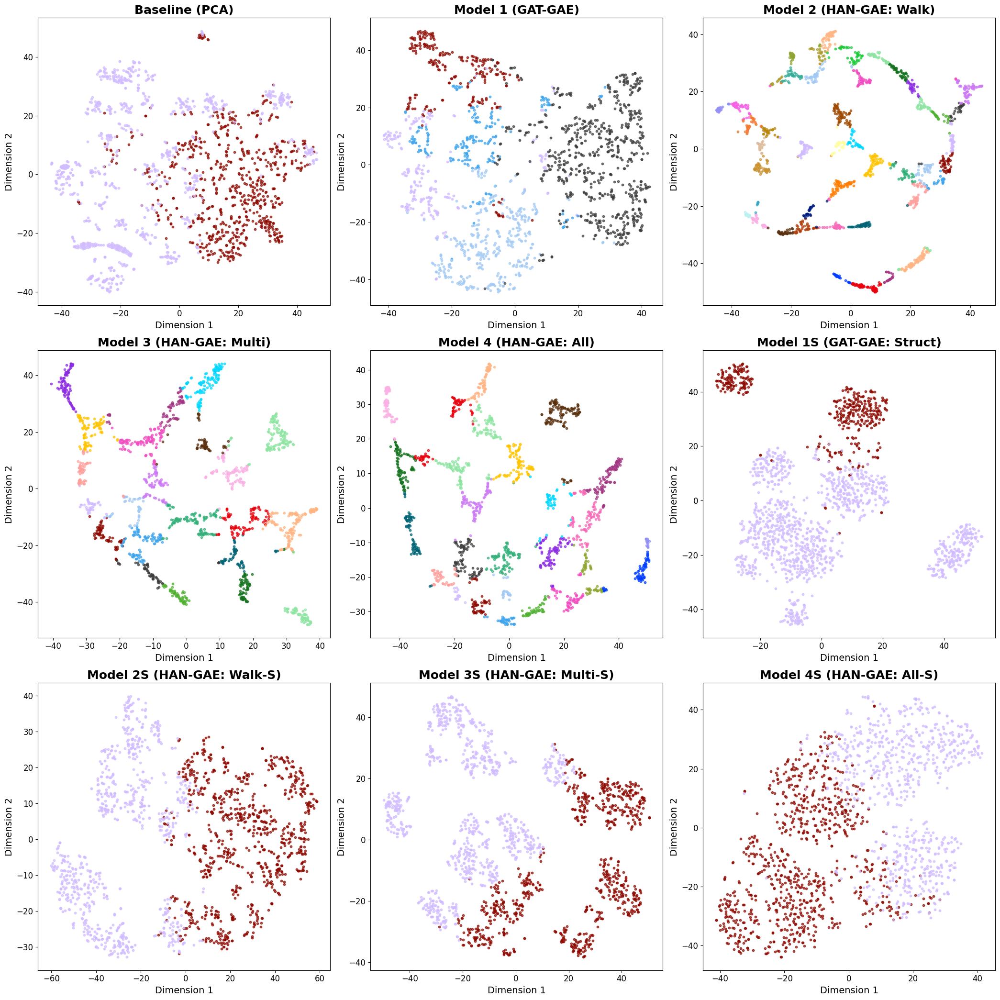

In [20]:
models_to_plot = list(model_gdfs.keys())
n_models = len(models_to_plot)
n_cols = 3
n_rows = (n_models + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(21, n_rows * 7))
axes = axes.flatten()

for idx, model_name in enumerate(models_to_plot):
    ax = axes[idx]
    gdf = model_gdfs[model_name]
    result = clustering_results[model_name]
    Z = get_embeddings(gdf, MODELS[model_name]["type"])

    # Rank clusters by cosine similarity to city-centre cluster (same as cluster maps)
    centre_pos = list(gdf.index).index(centre_oa_idx)
    target_label = result["labels"][centre_pos]
    centroids = pd.DataFrame(Z).assign(label=result["labels"]).groupby("label").mean()
    target_vec = centroids.loc[target_label].values.reshape(1, -1)
    cluster_sims = dict(zip(centroids.index, cosine_similarity(target_vec, centroids.values)[0]))
    sorted_labels = sorted(cluster_sims, key=cluster_sims.get, reverse=True)
    rank_color_map = {label: GLOBAL_COLORS[i % len(GLOBAL_COLORS)] for i, label in enumerate(sorted_labels)}

    tsne = TSNE(n_components=2, perplexity=30, random_state=config["seeds"]["tsne"])
    Z_2d = tsne.fit_transform(Z)

    # Plot each cluster with its ranked colour
    for rank, label in enumerate(sorted_labels):
        mask = np.array(result["labels"]) == label
        ax.scatter(Z_2d[mask, 0], Z_2d[mask, 1],
                   c=rank_color_map[label], s=10, alpha=0.7, label=str(rank))
    ax.set_title(f"{model_name}", fontsize=18, fontweight="bold")
    ax.set_xlabel("Dimension 1", fontsize=14)
    ax.set_ylabel("Dimension 2", fontsize=14)
    ax.tick_params(axis="both", labelsize=12)

# Hide unused axes
for i in range(len(models_to_plot), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.savefig(f"{FIGURES_DIR}/tsne_embeddings.jpg", dpi=150, bbox_inches="tight")
plt.show()

## 9. Isochrone Analysis

Generate isochrones from Liverpool ONE using the Baseline graph.

In [21]:
# Load Baseline Graph (contains full network structure)
data = torch.load('../data/processed/graphs/hetero_multi.pt', map_location='cpu', weights_only=False)

# Convert to dict of GeoDataFrames
nodes, edges = c2g.pyg_to_gdf(data)

# Filter edges to keep only the ones we're interested in
edge_types_to_keep = [
    ('bus_station', 'is_nearby', 'street_connector'),
    ('street_connector', 'is_connected_to', 'street_connector'),
    ('bus_station', 'is_next_to', 'bus_station')
]
edges = {k: edges[k] for k in edge_types_to_keep if k in edges}

In [22]:
# Liverpool ONE coordinates
center_point = gpd.GeoSeries(
    [Point(CITY_CENTRE["lon"], CITY_CENTRE["lat"])],
    crs="EPSG:4326",
).to_crs(nodes["oa"].crs)

# Define travel times (minutes) and convert once to seconds
travel_times = list(range(5, 35, 5))  # [5, 10, 15, 20, 25, 30]
travel_times_sorted = sorted(travel_times, reverse=True)
thresholds_sec = [mins * 60 for mins in travel_times_sorted]

# Keep only street-connector edges for walking isochrones
# Build walk-only and multimodal networks from the same base graph
walk_edge_type = ("street_connector", "is_connected_to", "street_connector")
walk_edges = {etype: egdf for etype, egdf in edges.items() if etype == walk_edge_type}

# 1) Walk isochrones (single API call, multiple thresholds)
iso_walk_all = c2g.create_isochrone(
    nodes=nodes,
    edges=walk_edges,
    center_point=center_point,
    threshold=thresholds_sec,  # Sequence[float] supported in current API
    edge_attr="travel_time_sec",
    method="concave_hull_knn",
)

# 2) Multimodal isochrones (single API call, multiple thresholds)
iso_multi_all = c2g.create_isochrone(
    nodes=nodes,
    edges=edges,
    center_point=center_point,
    threshold=thresholds_sec,  # Sequence[float] supported in current API
    edge_attr="travel_time_sec",
    cut_edge_types=[("bus_station", "is_next_to", "bus_station")],
    method="concave_hull_knn",
)

# Optional: keep your old dict structure (keyed by minutes)
# Store each isochrone in a minute-keyed dictionary for downstream analysis
iso_gdfs_walk = {
    mins: iso_walk_all.loc[iso_walk_all["threshold"] == mins * 60, ["geometry"]].reset_index(drop=True)
    for mins in travel_times_sorted
}
iso_gdfs_multi = {
    mins: iso_multi_all.loc[iso_multi_all["threshold"] == mins * 60, ["geometry"]].reset_index(drop=True)
    for mins in travel_times_sorted
}

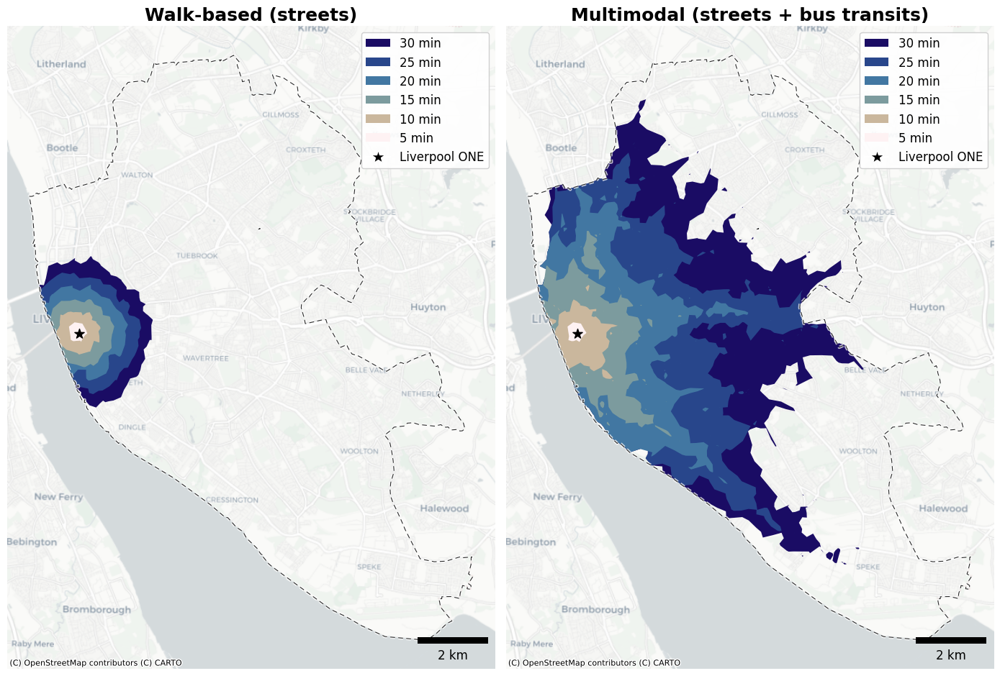

In [23]:
import matplotlib.patheffects as pe
from matplotlib_scalebar.scalebar import ScaleBar

# Isochrone Visualization
# Sequential colormap (reviewer request): nothing is special about the middle of the range
palette = [cmc.lapaz(i) for i in np.linspace(0, 1, len(travel_times))]

fig, axes = plt.subplots(1, 2, figsize=(14, 10))

for ax, iso_dict, title in [
    (axes[0], iso_gdfs_walk, "Walk-based (streets)"),
    (axes[1], iso_gdfs_multi, "Multimodal (streets + bus transits)"),
]:
    # Study-area extent (OA polygons)
    oa_extent = gpd.GeoSeries([oa_polygons.union_all()], crs=oa_polygons.crs)
    oa_extent.plot(
        ax=ax,
        facecolor="none",
        edgecolor="#2b2b2b",      # soft near-black instead of default blue
        linewidth=0.8,
        linestyle=(0, (6, 4)),     # even, well-spaced dashes
        zorder=5,                  # sit above isochrones, below the centre marker
        path_effects=[pe.withStroke(linewidth=3.2, foreground="white", alpha=0.7)],
    )
    
    legend_elements = []
    for i, mins in enumerate(travel_times_sorted):
        iso_dict[mins].plot(ax=ax, color=palette[i], alpha=1, edgecolor=None, linewidth=0.5, zorder=1)
        legend_elements.append(Patch(facecolor=palette[i], edgecolor=None, label=f'{mins} min'))
            
    # Plot center point
    center_point.plot(ax=ax, color='black', marker='*', markersize=100, zorder=10, edgecolor=None)
    legend_elements.append(Line2D([0], [0], marker='*', color='w', label='Liverpool ONE', 
                                  markerfacecolor='black', markersize=15, markeredgecolor='white'))
    
    contextily.add_basemap(ax, crs=nodes["oa"].crs, source=contextily.providers.CartoDB.Positron, zoom=12)
    
    # Add scalebar
    scalebar = ScaleBar(1, units="m", location="lower right", frameon=False, font_properties={'size': 12}, border_pad=0.5)
    ax.add_artist(scalebar)
    
    ax.legend(handles=legend_elements, loc='upper right', fontsize=12, frameon=True, framealpha=0.9)
    ax.set_title(title, fontsize=18, fontweight='bold')
    ax.set_axis_off()

plt.tight_layout()
plt.savefig(os.path.join(FIGURES_DIR, 'isochrones.jpg'), dpi=200, bbox_inches='tight')
plt.show()

## 10. Isochrone-grounded interpretation (0–30 min, walk vs multimodal)

This section links embedding similarity, semantic attention, and clustering to walk vs multimodal accessibility rings (0–15, 15–30, 30+ min) and evaluates a 2-hop diagnostic for the 15-min relations.

In [24]:
# Travel time bins from isochrone polygons (walk vs multi)

oa_points = gpd.GeoSeries(
    oa_polygons['pop_weighted_centroid'].apply(wkt.loads),
    crs=oa_polygons.crs
)

# Compute minimum reachable minutes for each OA from isochrone polygons
bins = [0, 5, 10, 15, 20, 25, 30, np.inf]
bin_labels = ['0-5', '5-10', '10-15', '15-20', '20-25', '25-30', '>30']

# Assign each OA to the first travel-time bin whose polygon contains its centroid
t_walk_bin, t_multi_bin = [], []
for iso_dict, out_list in [(iso_gdfs_walk, t_walk_bin), (iso_gdfs_multi, t_multi_bin)]:
    min_time = pd.Series(np.inf, index=oa_points.index, dtype=float)
    for t in sorted(iso_dict):
        geom = iso_dict[t].geometry.union_all()
        min_time[oa_points.within(geom) & (min_time > t)] = t
    out_list.append(pd.cut(min_time, bins=bins, labels=bin_labels, include_lowest=True))

t_walk_bin = t_walk_bin[0]
t_multi_bin = t_multi_bin[0]

/var/folders/_n/l2f9tkgn3g17dj7hnsjprssc0000gn/T/ipykernel_53856/3171209180.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  decay_df.groupby(["Model", "Mode", "time_bin"])["similarity"]


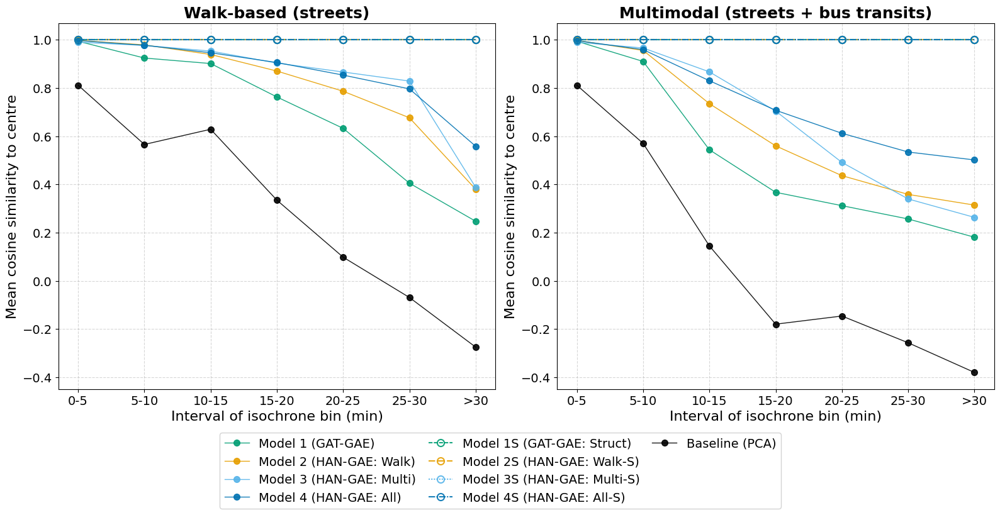

In [26]:
# Decay curves (cosine similarity vs isochrone bins)

decay_records = []

# Collect similarity-to-centre values for every model and travel mode
for model_name in model_gdfs:
    gdf = model_gdfs[model_name]
    Z = get_embeddings(gdf, MODELS[model_name]["type"])
    centre_pos = list(gdf.index).index(centre_oa_idx)
    sims = cosine_similarity(Z[centre_pos:centre_pos+1], Z)[0]
    
    for mode_name, t_bin in [("Walk-based (streets)", t_walk_bin), ("Multimodal (streets + bus transits)", t_multi_bin)]:
        # Pair each OA similarity score with its walk or multimodal time bin
        decay_records.append(pd.DataFrame({
            "Model": model_name,
            "Mode": mode_name,
            "time_bin": t_bin.loc[gdf.index].values,
            "similarity": sims
        }))

decay_df = pd.concat(decay_records, ignore_index=True)
decay_df["time_bin"] = pd.Categorical(decay_df["time_bin"], categories=bin_labels, ordered=True)

# Aggregate mean similarity per bin
decay_summary = (
    decay_df.groupby(["Model", "Mode", "time_bin"])["similarity"]
    .mean()
    .reset_index()
    .dropna()
 )

# Consistent color scheme: each model family shares a base hue,
# struct variants use the same color but dashed lines
MODEL_COLORS = {
    "Baseline (PCA)":              "#000000",  # black
    "Model 1 (GAT-GAE)":           "#009E73",  # bluish green
    "Model 2 (HAN-GAE: Walk)":     "#E69F00",  # orange
    "Model 3 (HAN-GAE: Multi)":    "#56B4E9",  # sky blue
    "Model 4 (HAN-GAE: All)":      "#0072B2",  # blue
    "Model 1S (GAT-GAE: Struct)":  "#009E73",
    "Model 2S (HAN-GAE: Walk-S)":  "#E69F00",
    "Model 3S (HAN-GAE: Multi-S)": "#56B4E9",
    "Model 4S (HAN-GAE: All-S)":   "#0072B2",
}
MODEL_MARKERS = {
    "Baseline (PCA)":                 "o",
    "Model 1 (GAT-GAE)":              "s",
    "Model 2 (HAN-GAE: Walk)":        "^",
    "Model 3 (HAN-GAE: Multi)":       "D",
    "Model 4 (HAN-GAE: All)":         "v",
    "Model 1S (GAT-GAE: Struct)":     "s",
    "Model 2S (HAN-GAE: Walk-S)":     "^",
    "Model 3S (HAN-GAE: Multi-S)":    "D",
    "Model 4S (HAN-GAE: All-S)":      "v",
}

struct_models = [m for m in model_gdfs if "S (" in m]
other_models = [m for m in model_gdfs if "S (" not in m]

struct_dashes = {
    "Model 1S (GAT-GAE: Struct)":  (3, 1),
    "Model 2S (HAN-GAE: Walk-S)":  (5, 2),
    "Model 3S (HAN-GAE: Multi-S)": (1, 1),
    "Model 4S (HAN-GAE: All-S)":   (5, 1, 1, 1),
}

fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)
for ax, mode in zip(axes, ["Walk-based (streets)", "Multimodal (streets + bus transits)"]):
    sub = decay_summary[decay_summary["Mode"] == mode]

    # Plot non-struct models with solid lines
    for m in other_models:
        sub_m = sub[sub["Model"] == m]
        ax.plot(sub_m["time_bin"], sub_m["similarity"],
                marker='o', markersize=7,
                color=MODEL_COLORS[m], label=m,
                linewidth=1, linestyle="-", alpha=0.9)

    # Plot struct models with styled dashed lines to prevent grey overlap
    for i, m in enumerate(struct_models):
        sub_m = sub[sub["Model"] == m]
        ax.plot(sub_m["time_bin"], sub_m["similarity"],
                marker='o', markersize=8, fillstyle='none', markeredgewidth=1.5,
                color=MODEL_COLORS[m], label=m,
                linewidth=1.5, linestyle="--", dashes=struct_dashes[m], alpha=0.9)
    ax.set_title(f"{mode}", fontweight="bold", fontsize=18)
    ax.set_xlabel("Interval of isochrone bin (min)", fontsize=16)
    ax.set_ylabel("Mean cosine similarity to centre", fontsize=16)
    ax.tick_params(axis='both', labelsize=14)
    ax.grid(True, linestyle="--", alpha=0.5)

# Show y-axis tick labels on both subplots (sharey hides them on the right)
axes[1].tick_params(labelleft=True)

# Shared legend below the plots
handles, labels = axes[0].get_legend_handles_labels()
label_to_handle = dict(zip(labels, handles))

proposed = ["Model 1 (GAT-GAE)", "Model 2 (HAN-GAE: Walk)", "Model 3 (HAN-GAE: Multi)", "Model 4 (HAN-GAE: All)"]
struct = ["Model 1S (GAT-GAE: Struct)", "Model 2S (HAN-GAE: Walk-S)", "Model 3S (HAN-GAE: Multi-S)", "Model 4S (HAN-GAE: All-S)"]

ordered_handles = []
ordered_labels = []
col3 = [
    ("Baseline (PCA)", label_to_handle.get("Baseline (PCA)", Line2D([], [], linestyle="none"))),
    ("", Line2D([], [], linestyle="none")),
    ("", Line2D([], [], linestyle="none")),
    ("", Line2D([], [], linestyle="none")),
]

for k in range(4):
    ordered_handles.append(label_to_handle.get(proposed[k], Line2D([], [], linestyle="none")))
    ordered_labels.append(proposed[k])
for k in range(4):
    ordered_handles.append(label_to_handle.get(struct[k], Line2D([], [], linestyle="none")))
    ordered_labels.append(struct[k])
for k in range(4):
    ordered_handles.append(col3[k][1])
    ordered_labels.append(col3[k][0])

legend = fig.legend(handles=ordered_handles, labels=ordered_labels,
           loc="lower center", bbox_to_anchor=(0.5, -0.03),
           ncol=3, fontsize=14, title_fontsize=18,
           frameon=True, facecolor="white", framealpha=1, edgecolor="lightgray", columnspacing=1.0)
for text in legend.get_texts():
    if text.get_text() == '' or (text.get_text() not in labels and text.get_text() != 'Baseline (PCA)'):
        text.set_visible(False)
plt.tight_layout()
plt.subplots_adjust(bottom=0.22)
plt.savefig(os.path.join(FIGURES_DIR, "similarity_decay_by_time_bin.jpg"), dpi=200, bbox_inches="tight")#, pil_kwargs={'quality': 95})
plt.show()

decay_summary.to_csv(os.path.join(TABLES_DIR, "similarity_decay_by_time_bin.csv"), index=False)